In [1]:
!pip install hvplot

In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import hvplot.pandas 
import hvplot as hv

filepath = Path('machine_temp_failure_missing.csv')

In [2]:
df = pd.read_csv(filepath)
df

,timestamp,value
0,02-12-2013 21:15,73.967322
1,02-12-2013 21:20,74.935882
2,02-12-2013 21:25,76.124162
3,02-12-2013 21:30,78.140707
4,02-12-2013 21:35,79.329836
...,...,...
22690,19-02-2014 15:05,98.185415
22691,19-02-2014 15:10,97.804168
22692,19-02-2014 15:15,97.135468
22693,19-02-2014 15:20,98.056852


In [3]:
filepath = Path('machine_temp_failure_original.csv')
dfo=pd.read_csv(filepath)
dfo

,timestamp,value
0,2013-12-02 21:15:00,73.967322
1,2013-12-02 21:20:00,74.935882
2,2013-12-02 21:25:00,76.124162
3,2013-12-02 21:30:00,78.140707
4,2013-12-02 21:35:00,79.329836
...,...,...
22690,2014-02-19 15:05:00,98.185415
22691,2014-02-19 15:10:00,97.804168
22692,2014-02-19 15:15:00,97.135468
22693,2014-02-19 15:20:00,98.056852


In [4]:
df.rename(columns={'value': 'Temperature'}, inplace=True)
dfo.rename(columns={'value': 'Temperature'}, inplace=True)
dfo

,timestamp,Temperature
0,2013-12-02 21:15:00,73.967322
1,2013-12-02 21:20:00,74.935882
2,2013-12-02 21:25:00,76.124162
3,2013-12-02 21:30:00,78.140707
4,2013-12-02 21:35:00,79.329836
...,...,...
22690,2014-02-19 15:05:00,98.185415
22691,2014-02-19 15:10:00,97.804168
22692,2014-02-19 15:15:00,97.135468
22693,2014-02-19 15:20:00,98.056852


In [5]:
mean=df['Temperature'].mean()
maxx=df['Temperature'].max()
medn=df['Temperature'].median()

print(mean)
print(maxx)
print(medn)

85.96818770311663
108.5105428
89.25128993499999


In [6]:
missing_values = df.isnull().sum()
df.describe(include='all')

,timestamp,Temperature
count,22695,21410.000000
unique,22683,NaN
top,07-01-2014 02:45,NaN
freq,2,NaN
mean,NaN,85.968188
std,NaN,13.553070
min,NaN,2.084721
25%,NaN,83.082867
50%,NaN,89.251290
75%,NaN,93.910748


SO THERE ARE 1285 MISSING VALUES IN TEMPERATURE AND 0 MISSING VALUES IN THE TIMESTAMP
 
 
 
 

In [7]:
delta_temperature = []

for i in range(1, len(df)):
    difference = df.loc[i, 'Temperature'] - df.loc[i-1, 'Temperature']
    delta_temperature.append(difference)

df['delta_temperature'] = [None] + delta_temperature
df['delta_temperature'].shift(-1)
df


,timestamp,Temperature,delta_temperature
0,02-12-2013 21:15,73.967322,NaN
1,02-12-2013 21:20,74.935882,0.968560
2,02-12-2013 21:25,76.124162,1.188280
3,02-12-2013 21:30,78.140707,2.016546
4,02-12-2013 21:35,79.329836,1.189128
...,...,...,...
22690,19-02-2014 15:05,98.185415,NaN
22691,19-02-2014 15:10,97.804168,-0.381246
22692,19-02-2014 15:15,97.135468,-0.668700
22693,19-02-2014 15:20,98.056852,0.921384


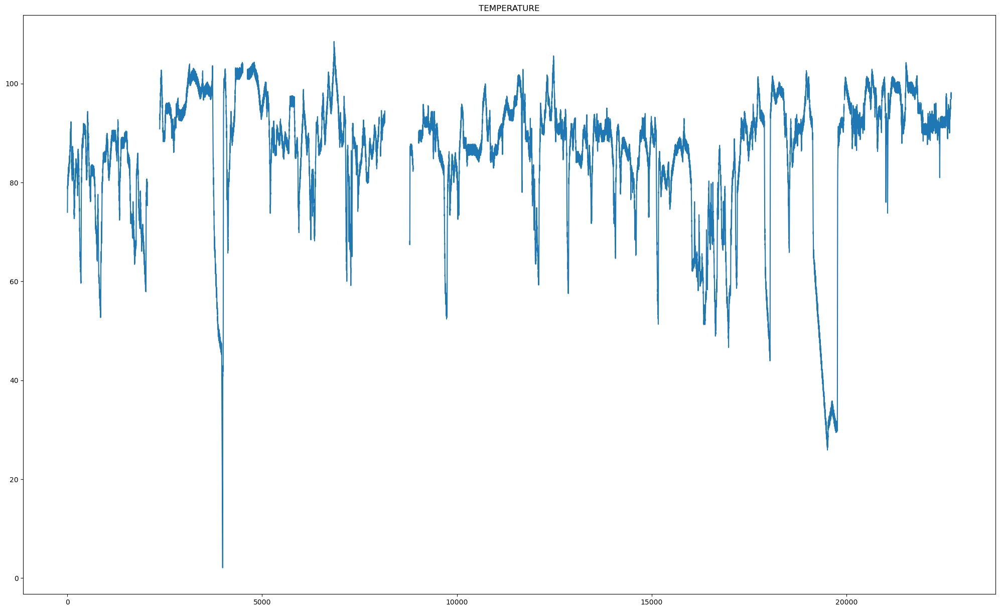

In [8]:
ypoints=df['Temperature']

fig, ax = plt.subplots(figsize=(25, 15))

ax.set_title("TEMPERATURE")

ax.plot(ypoints)

plt.show()

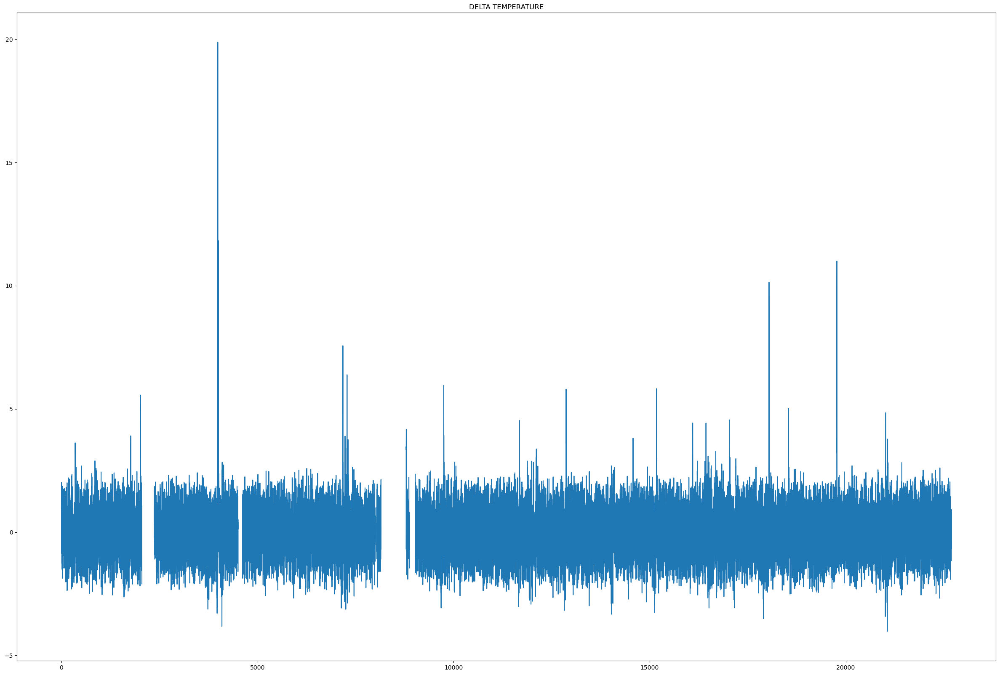

In [9]:
ypoints=df['delta_temperature']

fig, ax = plt.subplots(figsize=(30, 20))

ax.set_title("DELTA TEMPERATURE")

ax.plot(ypoints)

plt.show()

In [10]:
df = df.drop('delta_temperature', axis=1)
df

,timestamp,Temperature
0,02-12-2013 21:15,73.967322
1,02-12-2013 21:20,74.935882
2,02-12-2013 21:25,76.124162
3,02-12-2013 21:30,78.140707
4,02-12-2013 21:35,79.329836
...,...,...
22690,19-02-2014 15:05,98.185415
22691,19-02-2014 15:10,97.804168
22692,19-02-2014 15:15,97.135468
22693,19-02-2014 15:20,98.056852


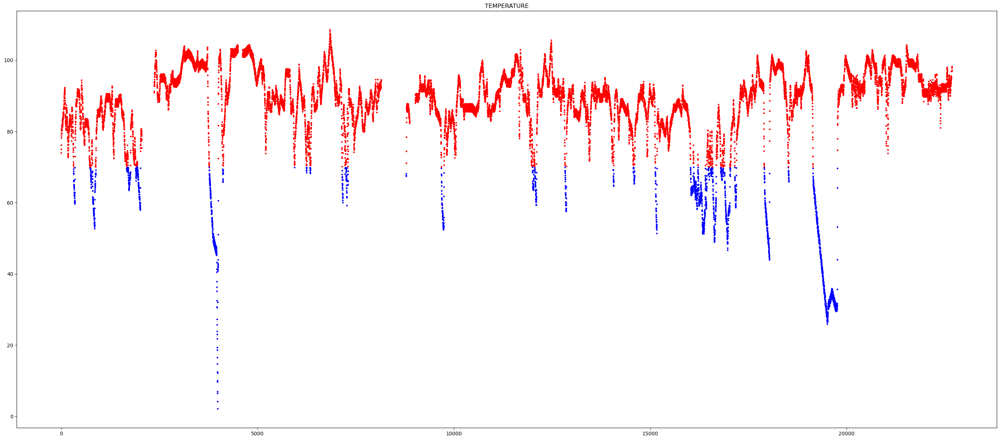

In [11]:
ypoints=df['Temperature']

fig, ax = plt.subplots(figsize=(35, 15))

ax.set_title("TEMPERATURE")

colors = ['r' if y > 70 else 'b' for y in ypoints]

ax.scatter(range(len(ypoints)),ypoints, color=colors,s=5)

plt.show()

In [12]:
########## READ DATASETS FUNCTION ##########

def read_datasets(foldr,file,date_col=None):
    df=pd.read_csv(folder / file, index_col=date_col, parse_dates=[date_col])
    
    return df

In [13]:
########## RMSE SCORE ##########

def rmse_score(dfo, df, col=None):
    
    df_missing = df.rename(columns={col: 'Temperature'})
    columns = df_missing.loc[:, 'Temperature':].columns.tolist()
    scores = []
    for comp_col in columns[1:]:
        rmse = np.sqrt(np.mean((dfo[col] - df_missing[comp_col])**2))
        scores.append(rmse)
        print(f'RMSE for {comp_col}: {rmse}')
    return scores

In [14]:
########## PLOT DFs ###########

def plot_dfs(dfo, df, col, title=None, xlabel=None, ylabel=None):
       
    df_missing = df.rename(columns={col: 'missing'})
    
    columns = df_missing.loc[:, 'missing':].columns.tolist()
    subplots_size = len(columns)
    
    fig, ax = plt.subplots(subplots_size+1, 1, sharex=True)
    plt.subplots_adjust(hspace=0.25)
    fig.suptitle = title 
    
    dfo[col].plot(ax=ax[0], figsize=(35, 20))
    ax[0].set_title('Original Dataset')
    ax[0].set_xlabel(xlabel)
    ax[0].set_ylabel(ylabel)    
    
    for i, colname in enumerate(columns):
        df_missing[colname].plot(ax=ax[i+1])
        ax[i+1].set_title(colname)

    plt.show()

In [15]:
df[df['Temperature'].isna()]

,timestamp,Temperature
2054,10-12-2013 00:25,NaN
2055,10-12-2013 00:30,NaN
2056,10-12-2013 00:35,NaN
2057,10-12-2013 00:40,NaN
2058,10-12-2013 00:45,NaN
...,...,...
22685,19-02-2014 14:40,NaN
22686,19-02-2014 14:45,NaN
22687,19-02-2014 14:50,NaN
22688,19-02-2014 14:55,NaN


In [16]:
df['ffill'] = df['Temperature'].fillna(method='ffill')
df['bfill'] = df['Temperature'].fillna(method='bfill')
df['mean'] = df['Temperature'].fillna(df['Temperature'].mean())
df

,timestamp,Temperature,ffill,bfill,mean
0,02-12-2013 21:15,73.967322,73.967322,73.967322,73.967322
1,02-12-2013 21:20,74.935882,74.935882,74.935882,74.935882
2,02-12-2013 21:25,76.124162,76.124162,76.124162,76.124162
3,02-12-2013 21:30,78.140707,78.140707,78.140707,78.140707
4,02-12-2013 21:35,79.329836,79.329836,79.329836,79.329836
...,...,...,...,...,...
22690,19-02-2014 15:05,98.185415,98.185415,98.185415,98.185415
22691,19-02-2014 15:10,97.804168,97.804168,97.804168,97.804168
22692,19-02-2014 15:15,97.135468,97.135468,97.135468,97.135468
22693,19-02-2014 15:20,98.056852,98.056852,98.056852,98.056852


In [17]:
rmse = rmse_score(dfo, df, 'Temperature')

RMSE for ffill: 2.4939956524274454
RMSE for bfill: 5.873128567455812
RMSE for mean: 3.961536496226712


In [18]:
from sklearn.impute import SimpleImputer

In [19]:
strategy = [
    ('Mean Strategy', 'mean'),
    ('Median Strategy', 'median'),
    ('Most Frequent Strategy', 'most_frequent')]

In [20]:
temp_vals = df['Temperature'].values.reshape(-1,1)

for s_name, s in strategy:
        df[s_name] = (
        SimpleImputer(strategy=s).fit_transform(temp_vals))
        
df

,timestamp,Temperature,ffill,bfill,mean,Mean Strategy,Median Strategy,Most Frequent Strategy
0,02-12-2013 21:15,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322
1,02-12-2013 21:20,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882
2,02-12-2013 21:25,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162
3,02-12-2013 21:30,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707
4,02-12-2013 21:35,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836
...,...,...,...,...,...,...,...,...
22690,19-02-2014 15:05,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415
22691,19-02-2014 15:10,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168
22692,19-02-2014 15:15,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468
22693,19-02-2014 15:20,98.056852,98.056852,98.056852,98.056852,98.056852,98.056852,98.056852


In [21]:
rmse = rmse_score(dfo, df, 'Temperature')

RMSE for ffill: 2.4939956524274454
RMSE for bfill: 5.873128567455812
RMSE for mean: 3.961536496226712
RMSE for Mean Strategy: 3.961536496226712
RMSE for Median Strategy: 4.071585793081295
RMSE for Most Frequent Strategy: 20.176855010139285


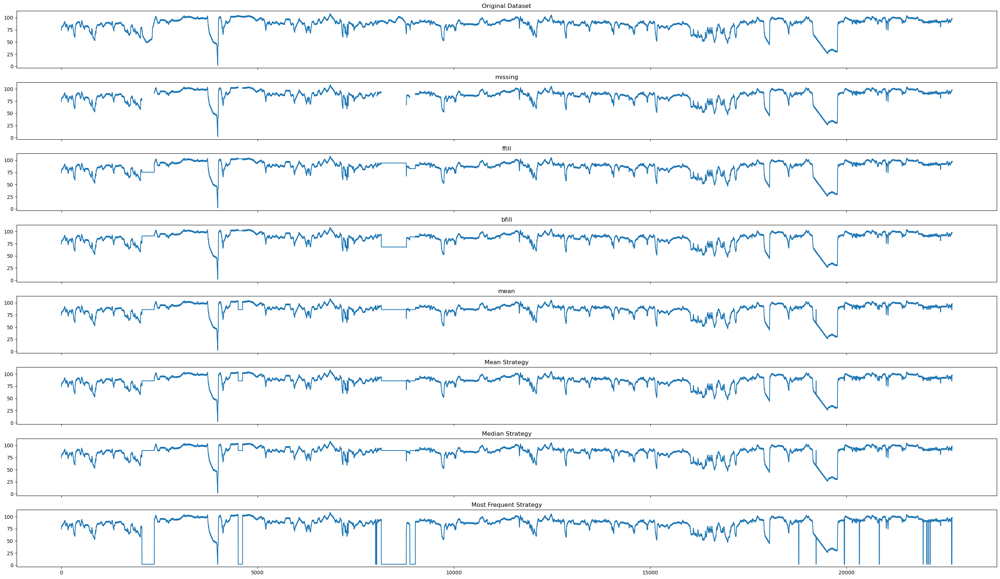

In [22]:
plot_dfs(dfo, df, 'Temperature')

In [23]:
df.hvplot.line('index')

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [24]:
df.interpolate()

,timestamp,Temperature,ffill,bfill,mean,Mean Strategy,Median Strategy,Most Frequent Strategy
0,02-12-2013 21:15,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322
1,02-12-2013 21:20,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882
2,02-12-2013 21:25,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162
3,02-12-2013 21:30,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707
4,02-12-2013 21:35,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836
...,...,...,...,...,...,...,...,...
22690,19-02-2014 15:05,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415
22691,19-02-2014 15:10,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168
22692,19-02-2014 15:15,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468
22693,19-02-2014 15:20,98.056852,98.056852,98.056852,98.056852,98.056852,98.056852,98.056852


In [25]:
interpolations = [
    'linear',
    'quadratic',
    'nearest',
    'cubic'
]

for intp in interpolations:
    df[intp] = df['Temperature'].interpolate(method=intp)

df['spline'] = \
        df['Temperature'].interpolate(method='spline', order=2)

df['polynomial'] = \
        df['Temperature'].interpolate(method='polynomial', order=5)

In [26]:
rmse = rmse_score(dfo, df, 'Temperature')

RMSE for ffill: 2.4939956524274454
RMSE for bfill: 5.873128567455812
RMSE for mean: 3.961536496226712
RMSE for Mean Strategy: 3.961536496226712
RMSE for Median Strategy: 4.071585793081295
RMSE for Most Frequent Strategy: 20.176855010139285
RMSE for linear: 4.043203597694257
RMSE for quadratic: 11.547623967933964
RMSE for nearest: 4.538509533797259
RMSE for cubic: 12.630605016546783
RMSE for spline: 30.609878524322
RMSE for polynomial: 1963.807569210983


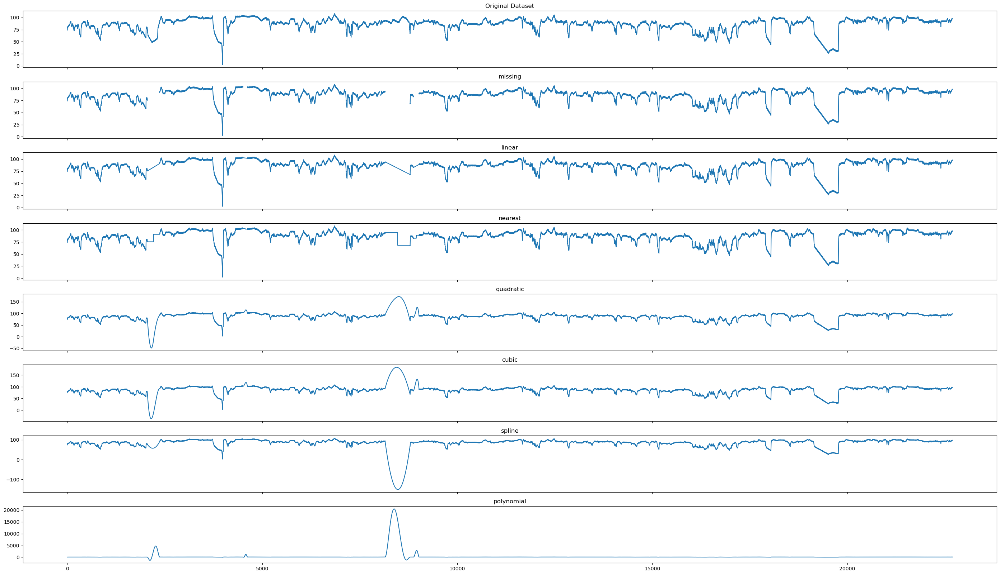

In [27]:
cols = ['Temperature', 'linear', 'nearest','quadratic','cubic','spline','polynomial']
plot_dfs(dfo, df[cols], 'Temperature')

THE RMSE IS COMING TO BE MINIMUM FOR THE FORWARD FILL, HENCE WE WILL RESAMPLE ITS DATA TO AN HOURLY FREQUENCY

In [37]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df.set_index('timestamp', inplace=True)
df

,Temperature,ffill,bfill,mean,Mean Strategy,Median Strategy,Most Frequent Strategy,linear,quadratic,nearest,cubic,spline,polynomial
timestamp,,,,,,,,,,,,,
2013-02-12 21:15:00,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322
2013-02-12 21:20:00,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882
2013-02-12 21:25:00,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162
2013-02-12 21:30:00,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707
2013-02-12 21:35:00,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-02-19 15:05:00,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415
2014-02-19 15:10:00,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168
2014-02-19 15:15:00,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468


In [40]:
df['ffill'].resample('H').mean()

timestamp
2013-02-12 21:00:00    78.011596
2013-02-12 22:00:00    80.598012
2013-02-12 23:00:00    81.625018
2013-02-13 00:00:00          NaN
2013-02-13 01:00:00          NaN
                         ...    
2014-12-02 19:00:00    97.351702
2014-12-02 20:00:00    94.759885
2014-12-02 21:00:00    98.165799
2014-12-02 22:00:00    97.762480
2014-12-02 23:00:00    95.542386
Freq: H, Name: ffill, Length: 15795, dtype: float64